In [1]:
import pandas as pd
import torch
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset,DataLoader, random_split
from torchvision import datasets, transforms
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler

from PIL import Image
import random
import os
import cv2

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

# 1. Build an object detection model using pytorch

In [3]:
class ObjectDetector(nn.Module):
    def __init__(self, basemodel, num_classes):
        super(ObjectDetector, self).__init__()
        self.basemodel = basemodel
        self.num_classes = num_classes

        self.feature_extractor = nn.Sequential(*list(self.basemodel.children())[:-1])
        
        # Replace the last layer with a classification and regression layer
        self.regressor = nn.Sequential(
            nn.Linear(self.basemodel.fc.in_features, 4)
        )
        self.classifier = nn.Sequential(
            nn.Linear(self.basemodel.fc.in_features, self.num_classes)
        )

        
    def forward(self, x):
        features = self.feature_extractor(x)
        #features = self.basemodel(x)
        features = features.view(features.size(0), -1)
        class_scores = self.classifier(features)
        bbox_preds = self.regressor(features)

        return class_scores, bbox_preds


In [4]:
def IoU(boxa, boxb): # (x, y, height, width)
    box1=[boxa[0],boxa[1],boxa[0]+boxa[3],boxa[1]+boxa[2]]
    box2=[boxb[0],boxb[1],boxb[0]+boxb[3],boxb[1]+boxb[2]]
    x1 = max(box1[0],box2[0])
    y1 = max(box1[1],box2[1])
    x2 = min(box1[2],box2[2])
    y2 = min(box1[3],box2[3])
    
    inter = max(0,x2-x1+1)*max(0, y2-y1+1)
    boxa_area = (boxa[2]+1)*(boxa[3]+1)
    boxb_area = (boxb[2]+1)*(boxb[3]+1)
    iou = inter/float(boxa_area+boxb_area-inter)
    
    return iou

In [5]:
def correct_count(pred, targets):
    _, pred_classes = torch.max(pred, dim=-1)
    #print(pred_classes, targets)
    correct = (pred_classes == targets).sum().item()
    #total = targets.numel()
    return correct

# 2. Train your model using [cow stall number datasets](https://github.com/YoushanZhang/Cow_stall_number)

In [6]:
train_csv_path=r'https://raw.githubusercontent.com/YoushanZhang/Cow_stall_number/main/Train.csv'
test_csv_path=r'https://raw.githubusercontent.com/YoushanZhang/Cow_stall_number/main/Test.csv'
Image_path = r'D:\application for the usa\YU\6. Deep learning\HW10\Stall_num_images'

In [7]:
df_train = pd.read_csv(train_csv_path)
df_test = pd.read_csv(test_csv_path)

In [8]:
df_train = df_train.fillna(0)
df_test = df_test.fillna(0)

In [9]:
df_train

,imageFilename,box_position_1,box_position_2,box_position_3,box_position_4,class_names
0,GH030066_4679.png,287.0,116.0,25.0,23.0,29
1,GH020058_19383.png,275.0,58.0,23.0,24.0,44
2,GH030061_1269.png,306.0,74.0,26.0,25.0,13
3,GH020058_17235.png,0.0,0.0,0.0,0.0,0
4,GH020058_18319.png,288.0,55.0,23.0,23.0,42
...,...,...,...,...,...,...
1037,GH010068_2548.png,277.0,117.0,22.0,22.0,24
1038,GH020061_19829.png,176.0,86.0,23.0,23.0,50
1039,GH050066_29877.png,277.0,119.0,25.0,22.0,53
1040,GH040066_1951.png,281.0,117.0,20.0,19.0,21


In [10]:
df_train['class_names'].value_counts()

0     182
28     28
14     22
3      19
31     19
     ... 
33     10
35     10
39      9
60      9
40      6
Name: class_names, Length: 61, dtype: int64

In [49]:
df_test['class_names'].value_counts()

0     43
31     8
51     7
28     7
9      6
      ..
40     2
30     2
19     1
4      1
2      1
Name: class_names, Length: 61, dtype: int64

In [11]:
'''
# Split train into train and validation
random.seed(10)
valid_index = random.sample(range(0,df_train.shape[0]),int(df_train.shape[0]*0.1))
train_index = [i for i in range(df_train.shape[0]) if i not in valid_index]
df_valid = df_train.loc[valid_index]
df_train = df_train.loc[train_index]
'''

'\n# Split train into train and validation\nrandom.seed(10)\nvalid_index = random.sample(range(0,df_train.shape[0]),int(df_train.shape[0]*0.1))\ntrain_index = [i for i in range(df_train.shape[0]) if i not in valid_index]\ndf_valid = df_train.loc[valid_index]\ndf_train = df_train.loc[train_index]\n'

In [12]:
#df_valid

In [13]:
df_train

,imageFilename,box_position_1,box_position_2,box_position_3,box_position_4,class_names
0,GH030066_4679.png,287.0,116.0,25.0,23.0,29
1,GH020058_19383.png,275.0,58.0,23.0,24.0,44
2,GH030061_1269.png,306.0,74.0,26.0,25.0,13
3,GH020058_17235.png,0.0,0.0,0.0,0.0,0
4,GH020058_18319.png,288.0,55.0,23.0,23.0,42
...,...,...,...,...,...,...
1037,GH010068_2548.png,277.0,117.0,22.0,22.0,24
1038,GH020061_19829.png,176.0,86.0,23.0,23.0,50
1039,GH050066_29877.png,277.0,119.0,25.0,22.0,53
1040,GH040066_1951.png,281.0,117.0,20.0,19.0,21


In [14]:
#df_train.groupby('class_names').count()

In [15]:
class ImageSet(Dataset):
    def __init__(self, img_dir, df, train=True):
        self.img_dir = img_dir
        self.file_name = df['imageFilename'].tolist()
        # box_position: [x, y, height, width]
        self.x = df['box_position_1'].tolist()
        self.y = df['box_position_2'].tolist()
        self.height = df['box_position_3'].tolist()
        self.width = df['box_position_4'].tolist()
        self.label = df['class_names'].tolist()
        self.train = train
        
    def train_transform(self, image, mask):
        resize = transforms.Resize(size=(270,270))
        image = resize(image)
        mask = resize(mask)

        # Random crop
        i, j, h, w = transforms.RandomCrop.get_params(
            image, output_size=(224,224))
        image = TF.crop(image, i, j, h, w)
        mask = TF.crop(mask, i, j, h, w)
        
        # Random horizontal flipping
        if random.random() > 0.5:
            image = TF.hflip(image)
            mask = TF.hflip(mask)
        
        # Random vertical flipping
        if random.random() > 0.5:
            image = TF.vflip(image)
            mask = TF.vflip(mask)
        
        # Center crop
        image = transforms.CenterCrop((224,224))(image)
        mask = transforms.CenterCrop((224,224))(mask)
            
        # Random rotation   
        if random.random() > 0.5:
            angle = random.randint(-10, 10)
            image = TF.rotate(image, angle)
            mask = TF.rotate(mask, angle)
        
        #
        color_t = transforms.ColorJitter() #brightness=0.5, contrast=1, saturation=0.1, hue=0.5
        image = color_t(image)
        
        # Transform to tensor
        image = TF.to_tensor(image)
        image = TF.normalize(image,(0.485, 0.456, 0.406), (0.229, 0.224, 0.225)) #(0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
        mask = TF.to_tensor(mask)
        return image, mask
    
    def test_transform(self, image, mask):
        resize = transforms.Resize(size=(270,270))
        image = resize(image)
        mask = resize(mask)

        # Random crop
        i, j, h, w = transforms.RandomCrop.get_params(
            image, output_size=(224,224))
        
        # Center crop
        image = transforms.CenterCrop((224,224))(image)
        mask = transforms.CenterCrop((224,224))(mask)        
        image = TF.crop(image, i, j, h, w)
        mask = TF.crop(mask, i, j, h, w)
        
        image = TF.to_tensor(image)
        image = TF.normalize(image,(0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        mask = TF.to_tensor(mask)
        return image, mask

    
    def mask_to_box(self,mask):
        if len(np.where(mask==255)[0]) > 0:
            x_scale, y_scale = np.where(mask==255)[1:]

            bbox = torch.tensor([x_scale.min(), y_scale.min(),x_scale.max()-x_scale.min(),y_scale.max()-y_scale.min()])
        else:
            bbox = torch.tensor([0,0,0,0])
        return bbox


        
    def __len__(self):
        return len(self.file_name)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.file_name[idx])
        img = Image.open(img_path) 
        label = torch.tensor(self.label[idx], dtype = torch.long)
        mask = np.zeros((img.size[1], img.size[0]))
        bbox = [self.x[idx],self.y[idx],self.height[idx],self.width[idx]]

        bbox = np.array(bbox, dtype = 'int')
        #print(bbox)
        mask[bbox[1]:bbox[1]+bbox[3]+1,bbox[0]:bbox[0]+bbox[2]+1]=255
        mask = Image.fromarray(mask)
        #os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
        #plt.figure()
        #plt.imshow(mask)
        if self.train:
            img, mask = self.train_transform(img, mask)
        else:
            img, mask = self.test_transform(img, mask)
            
        bbox = self.mask_to_box(mask)

        return img, bbox, label

In [16]:
batch_size=8
# Import dataset
train_dataset = ImageSet(Image_path,df_train,train=True)
#valid_dataset = ImageSet(Image_path,df_valid,train=True)
test_dataset = ImageSet(Image_path,df_test,train=False)

# Random split
#train_set_size = int(df_train.shape[0] * 0.9)
#valid_set_size = df_train.shape[0] - train_set_size
#train_set, valid_set = random_split(train_dataset, [train_set_size, valid_set_size])


# Create loaders
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
#valid_loader = torch.utils.data.DataLoader(dataset=valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=32, shuffle=False)


In [17]:
def gen_img(loader, num_img):
    image, Box, label = next(iter(loader))
    os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
    for i in range(num_img): 

        xi, yi, hi, wi =Box[i]
        fig, ax = plt.subplots(figsize=(15,6))
        plt.title(f'{label[i]}')
        ax.imshow(image[i].permute(1,2,0), 'gray')
        rect=patches.Rectangle((yi-2,xi),wi,hi, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

#plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


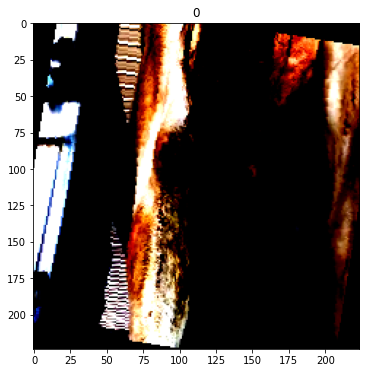

In [18]:
gen_img(train_loader, 1)

In [19]:
#gen_img(valid_loader, 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


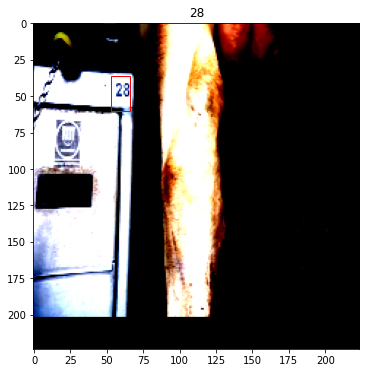

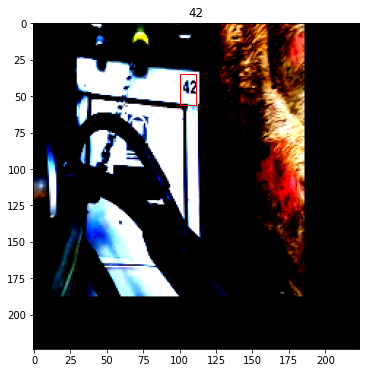

In [20]:
gen_img(test_loader, 2)

In [21]:
print('train_set_size:', len(train_dataset))
#print('valid_set_size:', len(valid_dataset))
print('test_set_size:', df_test.shape[0])

train_set_size: 1042
test_set_size: 261


In [22]:
image, Box, label = next(iter(train_loader))

In [23]:
Box[0]

tensor([61, 96, 20, 10])

In [24]:
image.shape

torch.Size([8, 3, 224, 224])

In [25]:
label.shape

torch.Size([8])

In [26]:
Box.shape

torch.Size([8, 4])

In [27]:
#i=1
#for image, box_target, class_target in train_loader:
    #print(image.shape,i)
    #i+=1

In [28]:
# Load the pre-trained model
#goo = models.googlenet(pretrained=True)
#goo = models.vgg16(pretrained=True)
#goo = models.resnet34(pretrained=True)
#goo = models.resnet101(pretrained=True)
goo = models.resnet50(pretrained=True)

model = ObjectDetector(goo, num_classes=61).to('cuda')


# Freeze all layers
for param in model.parameters():
    param.requires_grad = False



total = len(list(model.feature_extractor.children()))
for i, layer in enumerate(model.feature_extractor.children()):
    if i >= total - 3: # Unfreeze the last 3 layers of the feature_extractor
        for param in layer.parameters():
            param.requires_grad = True


for param in model.classifier.parameters():
    param.requires_grad = True


for param in model.regressor.parameters():
    param.requires_grad = True


# Define the optimizer
optimizer = torch.optim.Adam(list(filter(lambda p: p.requires_grad, model.parameters())), lr=1e-4, weight_decay=5e-4)
#optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.00001)
#optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=0.1)

# Define your scheduler
scheduler = lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.5)

In [29]:
#for name, para in goo.named_parameters():
#    para.requires_grad = False
#    print("-"*20)
#    print(f"name: {name}")
#    print("values: ")
#    print(para)

In [30]:
def loss_function(box_target, box_pred, class_target, class_pred):
    iou_values = np.zeros(len(box_pred))
    box_loss = F.smooth_l1_loss(box_pred, box_target, reduction='mean')
    class_loss = nn.CrossEntropyLoss()(class_pred, class_target)
    #print(box_target, box_pred)
    #print(class_loss)
    #print(box_loss)
    
    
    # Remove the class 0
    for i in range(len(box_pred)):
        iou_values[i] = IoU(box_pred[i], box_target[i])

    iou_values = torch.tensor(iou_values).to('cuda')
    iou_loss = (1 - iou_values).mean()

    loss = 1.0 * class_loss + 0.1 * box_loss + 4.0 * iou_loss
    #print(loss)
    count = correct_count(class_pred, class_target)
    
    #print(box_loss, class_loss, iou_loss)
    #print(iou_loss)

    return loss, count, iou_values.mean().item()

In [31]:
# Train the model
num_epochs = 250
all_trainloss= []
all_valloss= []
all_train_acc = []
all_valid_acc=[]
all_train_iou=[]
all_valid_iou=[]

for epoch in range(num_epochs):
    model.train()
    train_loss, valid_loss = 0, 0
    train_iou, valid_iou = 0, 0
    train_count, valid_count=0, 0
    for image, box_target, class_target in train_loader:

        # Forward pass
        box_target = box_target.to(torch.float32)
        image, class_target, box_target = image.to('cuda'), class_target.to('cuda'), box_target.to('cuda')
        optimizer.zero_grad()
        class_pred, box_pred = model(image)
        
        #print('train')
        #print(box_target, box_pred)
        loss, count, iou = loss_function(box_target, box_pred, class_target, class_pred)
        
        l2_regularization = torch.tensor(0.).to('cuda')
        for param in model.parameters():
            l2_regularization += torch.norm(param, p=2)
        loss += 0.01 * l2_regularization

        # Backward pass
        
        loss.backward()
        optimizer.step()
        train_loss+=loss.item()        
        train_count+=count
        train_iou+=iou
        

        
    # Validation    
    model.eval()
    for image, box_target, class_target in test_loader:
        box_target = box_target.to(torch.float32)
        image, class_target, box_target = image.to('cuda'), class_target.to('cuda'), box_target.to('cuda')
        class_pred, box_pred = model(image)
        #print('validation')
        val_loss, val_count, val_iou = loss_function(box_target, box_pred, class_target, class_pred)
        valid_loss+=val_loss.item()   
        valid_iou+=val_iou
        valid_count+=val_count
        
    train_loss/=len(train_loader)
    valid_loss /= len(test_loader)
    train_iou/=len(train_loader)
    valid_iou /= len(test_loader)   
    #print(train_acc)
    train_acc = train_count / len(train_loader.dataset)*100
    valid_acc = valid_count / len(test_loader.dataset)*100
        
    all_trainloss.append(train_loss)
    all_train_acc.append(train_acc)    
    all_valloss.append(valid_loss)
    all_valid_acc.append(valid_acc)
    all_train_iou.append(train_iou*100)
    all_valid_iou.append(valid_iou*100)
    
    scheduler.step()
    
    if valid_acc >= 40 or (epoch+1)%100 == 0:
        PATH = f'ob1_{epoch+1}_v5.pth'
        torch.save(model.state_dict(), PATH)   


    # Print the loss and accuracy
    print(f"Epoch {epoch+1}, Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, IoU:{train_iou*100:.4f}, testLoss: { valid_loss:.4f}, testAcc: {valid_acc:.4f}, testIoU:{valid_iou*100:.4f}")

C:\Users\User\anaconda3\envs\dlenv\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Epoch 1, Loss: 20.9936, Acc: 18.4261, IoU:0.3694, testLoss: 10.5526, testAcc: 19.1571, testIoU:0.0000
Epoch 2, Loss: 19.5998, Acc: 22.7447, IoU:0.0613, testLoss: 9.5637, testAcc: 26.8199, testIoU:0.0000
Epoch 3, Loss: 18.5150, Acc: 30.0384, IoU:0.2787, testLoss: 8.5329, testAcc: 32.9502, testIoU:0.4516
Epoch 4, Loss: 17.3672, Acc: 39.5393, IoU:0.5880, testLoss: 8.1129, testAcc: 42.5287, testIoU:0.9104
Epoch 5, Loss: 16.8322, Acc: 44.6257, IoU:0.9045, testLoss: 8.1282, testAcc: 39.8467, testIoU:0.4130
Epoch 6, Loss: 16.1393, Acc: 53.3589, IoU:1.2493, testLoss: 7.7593, testAcc: 41.3793, testIoU:0.4235
Epoch 7, Loss: 15.7237, Acc: 56.8138, IoU:1.9468, testLoss: 7.3306, testAcc: 51.7241, testIoU:3.4784
Epoch 8, Loss: 15.3355, Acc: 62.8599, IoU:3.6658, testLoss: 7.2416, testAcc: 53.6398, testIoU:4.3647
Epoch 9, Loss: 15.0113, Acc: 68.0422, IoU:4.3251, testLoss: 7.1826, testAcc: 56.7050, testIoU:3.3151
Epoch 10, Loss: 14.8170, Acc: 73.4165, IoU:3.2544, testLoss: 6.8057, testAcc: 62.4521, tes

Epoch 81, Loss: 10.0538, Acc: 99.3282, IoU:31.5444, testLoss: 3.6194, testAcc: 86.5900, testIoU:37.6534
Epoch 82, Loss: 10.1686, Acc: 99.1363, IoU:29.8902, testLoss: 3.7064, testAcc: 88.1226, testIoU:33.2196
Epoch 83, Loss: 9.9127, Acc: 99.2322, IoU:34.3417, testLoss: 4.1946, testAcc: 85.0575, testIoU:27.9846
Epoch 84, Loss: 9.8972, Acc: 99.1363, IoU:34.2658, testLoss: 3.9050, testAcc: 86.2069, testIoU:33.0088
Epoch 85, Loss: 9.9371, Acc: 99.3282, IoU:33.3452, testLoss: 3.8371, testAcc: 85.0575, testIoU:34.0248
Epoch 86, Loss: 10.0636, Acc: 99.3282, IoU:30.5493, testLoss: 3.5450, testAcc: 87.3563, testIoU:39.2002
Epoch 87, Loss: 9.9033, Acc: 99.8081, IoU:32.8779, testLoss: 4.4228, testAcc: 85.4406, testIoU:23.6292
Epoch 88, Loss: 9.6967, Acc: 98.6564, IoU:37.4066, testLoss: 3.9939, testAcc: 82.3755, testIoU:32.3065
Epoch 89, Loss: 9.9242, Acc: 99.2322, IoU:32.5132, testLoss: 3.6544, testAcc: 83.5249, testIoU:38.8862
Epoch 90, Loss: 9.7893, Acc: 99.1363, IoU:35.1907, testLoss: 3.7526, t

Epoch 160, Loss: 8.5833, Acc: 100.0000, IoU:53.5105, testLoss: 3.2622, testAcc: 87.7395, testIoU:46.3283
Epoch 161, Loss: 8.5461, Acc: 100.0000, IoU:54.2370, testLoss: 3.1421, testAcc: 88.8889, testIoU:47.5298
Epoch 162, Loss: 8.6827, Acc: 100.0000, IoU:50.9888, testLoss: 3.0437, testAcc: 88.5057, testIoU:52.1878
Epoch 163, Loss: 8.6386, Acc: 100.0000, IoU:52.1906, testLoss: 3.5149, testAcc: 88.5057, testIoU:39.1999
Epoch 164, Loss: 8.8182, Acc: 99.9040, IoU:48.6909, testLoss: 3.5127, testAcc: 87.7395, testIoU:40.7585
Epoch 165, Loss: 8.5951, Acc: 100.0000, IoU:53.0280, testLoss: 3.0681, testAcc: 89.6552, testIoU:48.3465
Epoch 166, Loss: 8.5895, Acc: 99.9040, IoU:52.9413, testLoss: 3.3170, testAcc: 89.2720, testIoU:44.8959
Epoch 167, Loss: 8.6786, Acc: 99.6161, IoU:51.8198, testLoss: 3.0716, testAcc: 88.8889, testIoU:48.8101
Epoch 168, Loss: 8.6867, Acc: 99.8081, IoU:51.1515, testLoss: 3.3246, testAcc: 88.1226, testIoU:44.2166
Epoch 169, Loss: 8.5565, Acc: 99.7121, IoU:53.7645, testLos

Epoch 239, Loss: 8.4409, Acc: 99.9040, IoU:54.6705, testLoss: 3.0331, testAcc: 87.7395, testIoU:48.7619
Epoch 240, Loss: 8.4306, Acc: 99.9040, IoU:55.4811, testLoss: 3.3650, testAcc: 85.4406, testIoU:43.0355
Epoch 241, Loss: 8.3765, Acc: 99.9040, IoU:56.8848, testLoss: 2.9657, testAcc: 88.1226, testIoU:51.1508
Epoch 242, Loss: 8.3924, Acc: 99.9040, IoU:56.4770, testLoss: 3.6889, testAcc: 88.8889, testIoU:34.3391
Epoch 243, Loss: 8.3383, Acc: 99.9040, IoU:57.0292, testLoss: 3.3363, testAcc: 85.4406, testIoU:45.7644
Epoch 244, Loss: 8.4340, Acc: 100.0000, IoU:54.8848, testLoss: 3.1506, testAcc: 88.5057, testIoU:47.1213
Epoch 245, Loss: 8.3577, Acc: 100.0000, IoU:56.4271, testLoss: 3.1856, testAcc: 89.6552, testIoU:46.8925
Epoch 246, Loss: 8.4443, Acc: 100.0000, IoU:55.2101, testLoss: 3.0278, testAcc: 88.8889, testIoU:48.9675
Epoch 247, Loss: 8.4282, Acc: 99.9040, IoU:56.3151, testLoss: 3.4112, testAcc: 89.2720, testIoU:38.2800
Epoch 248, Loss: 8.4150, Acc: 100.0000, IoU:55.4885, testLoss

In [32]:
df = pd.DataFrame(zip(all_trainloss,all_train_acc,all_train_iou,all_valloss,all_valid_acc,all_valid_iou),
                  columns=['train_loss','train_acc','train_iou','test_loss','test_acc','test_iou'])

In [33]:
df

,train_loss,train_acc,train_iou,test_loss,test_acc,test_iou
0,20.993605,18.426104,0.369440,10.552577,19.157088,0.000000
1,19.599767,22.744722,0.061266,9.563682,26.819923,0.000000
2,18.515043,30.038388,0.278677,8.532882,32.950192,0.451594
3,17.367179,39.539347,0.587988,8.112909,42.528736,0.910374
4,16.832182,44.625720,0.904532,8.128211,39.846743,0.413049
...,...,...,...,...,...,...
245,8.444342,100.000000,55.210111,3.027837,88.888889,48.967485
246,8.428166,99.904031,56.315100,3.411165,89.272031,38.280022
247,8.414992,100.000000,55.488492,3.212155,89.272031,44.348240
248,8.337919,99.904031,57.011099,3.025738,89.272031,48.906371


In [34]:
df.to_csv('ob_detection_v5.csv')
df = pd.read_csv('ob_detection_v5.csv')

In [35]:
index = (df[df.loc[:,'test_acc']>=80].index.values)+1

In [36]:
index = np.append(index, [100,200])
index

array([ 25,  31,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,
        44,  45,  46,  47,  48,  49,  50,  51,  53,  54,  55,  56,  57,
        58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,  70,
        71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,
        84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,
        97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109,
       110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122,
       123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135,
       136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
       149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161,
       162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174,
       175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187,
       188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200,
       201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 21

Text(0.5, 0, 'epoch')

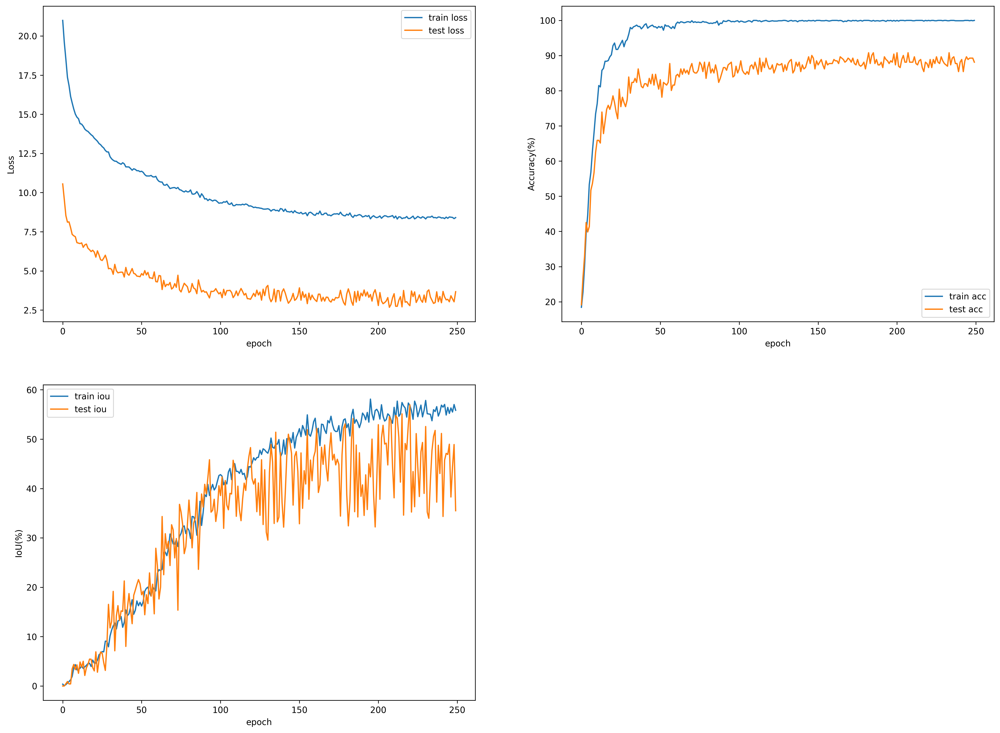

In [37]:
plt.rcParams['figure.dpi'] = 300
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
df=pd.read_csv('ob_detection_v5.csv')
x = [i for i in range(250)]
plt.figure(figsize=(20,15))
plt.subplot(221)
plt.plot(x, df.loc[:,'train_loss'])
plt.plot(x, df.loc[:,'test_loss'])
plt.legend(['train loss','test loss'])
plt.ylabel('Loss')
plt.xlabel('epoch')


plt.subplot(222)
plt.plot(x, df.loc[:,'train_acc'])
plt.plot(x, df.loc[:,'test_acc'])
plt.legend(['train acc','test acc'])
plt.ylabel('Accuracy(%)')
plt.xlabel('epoch')

plt.subplot(223)
plt.plot(x, df.loc[:,'train_iou'])
plt.plot(x, df.loc[:,'test_iou'])
plt.legend(['train iou','test iou'])
plt.ylabel('IoU(%)')
plt.xlabel('epoch')

# 3.Evaluate your model using the test images

In [38]:
torch.cuda.empty_cache()

In [39]:
all_acc={}
all_iou={}
for i in index:
    #torch.cuda.empty_cache()
    PATH = f'ob1_{i}_v5.pth'
    model.load_state_dict(torch.load(PATH))
    model.eval()
    
    count, iou= 0, 0
    with torch.no_grad():
        for data in test_loader:
            image, box_target, class_target = data
            box_target = box_target.to(torch.float32)
            image, class_target, box_target = image.to('cuda'), class_target.to('cuda'), box_target.to('cuda')
            class_pred, box_pred = model(image)
            '''
            for i in range(len(box_target)):
                print(box_target[i], box_pred[i])
            
                print(IoU(box_target[i], box_pred[i]))
            
            _, pred_label = torch.max(class_pred, dim=-1)
            '''
            test_loss, test_count, test_iou = loss_function(box_target, box_pred, class_target, class_pred)
            count+=test_count
            iou+=test_iou
            '''
            #---------------------Plot Figures----------------------------------------
            for r in range(image.shape[0]):
                os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
                image, box_pred, pred_label = image.to('cpu'), box_pred.to('cpu'), pred_label.to('cpu')
                xi, yi, hi, wi = box_pred[r]
                fig, ax = plt.subplots(figsize=(8,6))
                #plt.subplot(1,image.shape[0],r+1)
                plt.title(f'{pred_label[r]},{xi}, {yi}, {hi}, {wi}')
                ax.imshow(image[r].permute(1,2,0), 'gray')
                rect=patches.Rectangle((yi-2,xi),wi,hi, linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                plt.show()
            '''
    iou = iou/len(test_loader)*100
    acc = count/len(test_loader.dataset)*100
    all_acc[f'epoch{i}']=acc
    all_iou[f'epoch{i}']=iou
            

In [40]:
all_acc

{'epoch25': 81.22605363984674,
 'epoch31': 84.67432950191571,
 'epoch33': 80.07662835249042,
 'epoch34': 81.22605363984674,
 'epoch35': 84.67432950191571,
 'epoch36': 80.45977011494253,
 'epoch37': 83.5249042145594,
 'epoch38': 83.14176245210729,
 'epoch39': 79.3103448275862,
 'epoch40': 81.99233716475096,
 'epoch41': 85.44061302681992,
 'epoch42': 80.45977011494253,
 'epoch43': 81.99233716475096,
 'epoch44': 83.14176245210729,
 'epoch45': 82.75862068965517,
 'epoch46': 82.37547892720306,
 'epoch47': 80.07662835249042,
 'epoch48': 82.37547892720306,
 'epoch49': 78.16091954022988,
 'epoch50': 83.5249042145594,
 'epoch51': 85.44061302681992,
 'epoch53': 82.75862068965517,
 'epoch54': 82.37547892720306,
 'epoch55': 77.39463601532567,
 'epoch56': 83.5249042145594,
 'epoch57': 85.0574712643678,
 'epoch58': 83.14176245210729,
 'epoch59': 79.6934865900383,
 'epoch60': 81.99233716475096,
 'epoch61': 86.20689655172413,
 'epoch62': 83.9080459770115,
 'epoch63': 84.67432950191571,
 'epoch64': 85.

In [41]:
all_iou

{'epoch25': 7.294800679988435,
 'epoch31': 13.139834408615975,
 'epoch33': 19.463524024597266,
 'epoch34': 5.340586690047833,
 'epoch35': 13.454690411061973,
 'epoch36': 16.824903094934093,
 'epoch37': 12.272807789682297,
 'epoch38': 15.652575600025656,
 'epoch39': 14.745017390642815,
 'epoch40': 20.89611049600838,
 'epoch41': 8.5651731580664,
 'epoch42': 15.976681571070609,
 'epoch43': 17.5425319626528,
 'epoch44': 15.290985863516148,
 'epoch45': 13.320565714804816,
 'epoch46': 17.42258682245544,
 'epoch47': 19.999925049810876,
 'epoch48': 18.7195173863923,
 'epoch49': 19.6875683540121,
 'epoch50': 19.261375053708132,
 'epoch51': 17.893173098401984,
 'epoch53': 14.136716506996486,
 'epoch54': 17.00383830064513,
 'epoch55': 16.538618551993647,
 'epoch56': 24.942809188926024,
 'epoch57': 18.23212603972125,
 'epoch58': 20.470622453568062,
 'epoch59': 13.455516872296963,
 'epoch60': 25.202239450914526,
 'epoch61': 23.350536217104594,
 'epoch62': 18.289810304478223,
 'epoch63': 19.21796820

# 4. Your results should be higher than 80%.

In [42]:
max_acc, max_iou=-np.inf, -np.inf
idx_acc, idx_iou=0, 0, 
for k in all_acc:
    if all_acc[k]>max_acc:
        max_acc = all_acc[k]
        idx_acc = k
    if all_iou[k]>max_iou:
        max_iou = all_iou[k]
        idx_iou = k
print(f'maximum accuracy: acc = {round(max_acc,2)} % ; iou = {round(all_iou[idx_acc],2)} % at {idx_acc}')
print(f'maximum iou score:acc = {round(all_acc[idx_iou],2)} % ; iou = {round(max_iou,2)} % at {idx_iou}')

maximum accuracy: acc = 91.95 % ; iou = 34.92 % at epoch222
maximum iou score:acc = 88.12 % ; iou = 57.15 % at epoch221


# Plot the result of best performanced model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

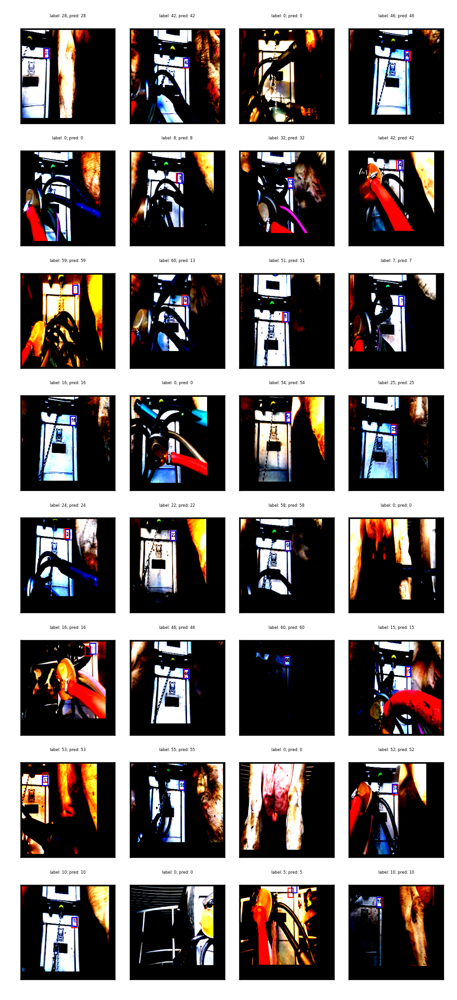

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

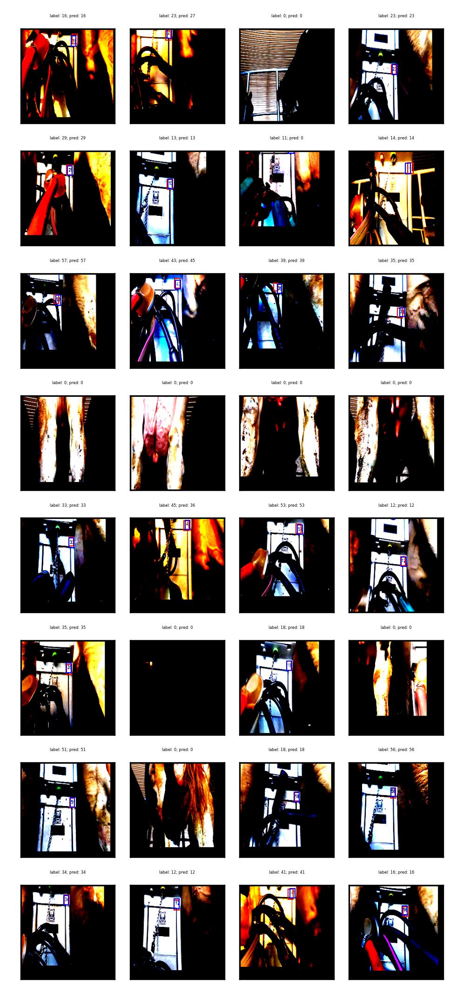

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

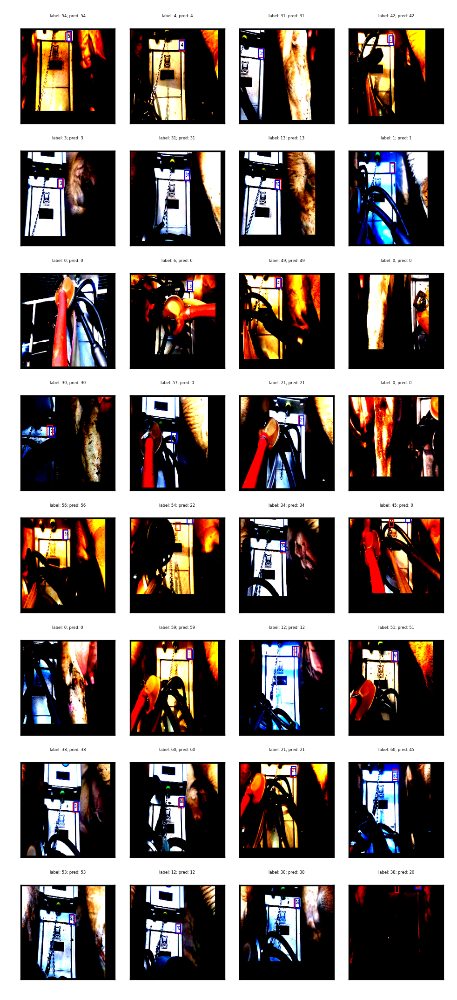

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

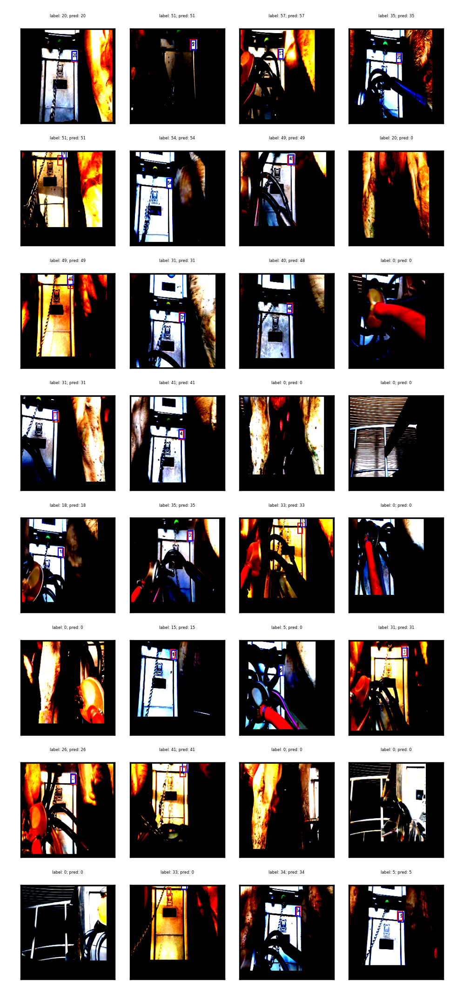

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

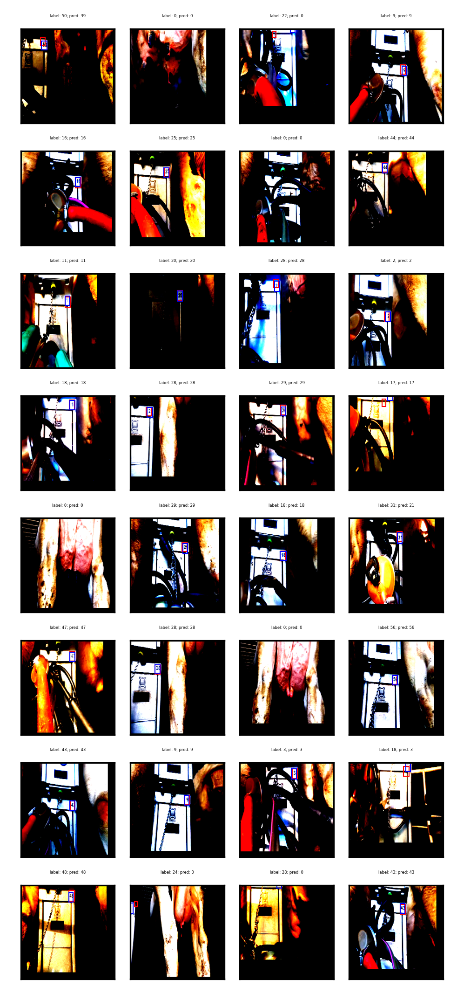

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

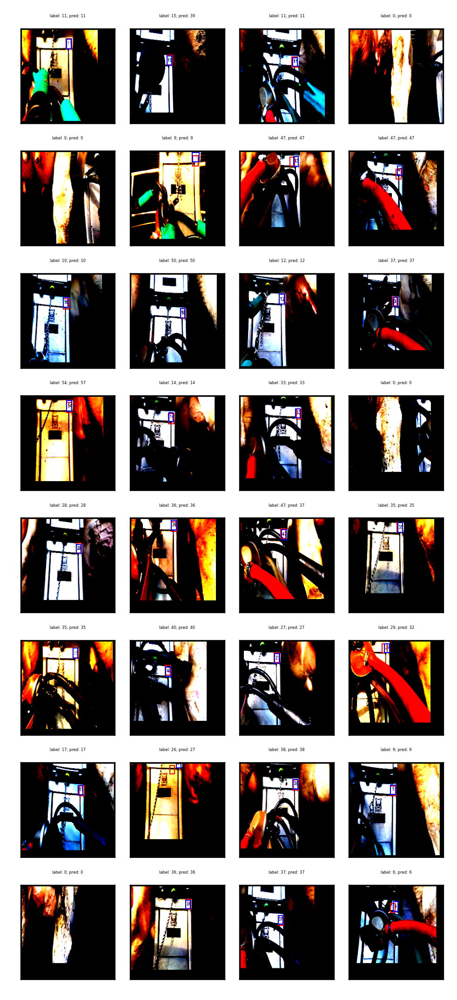

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

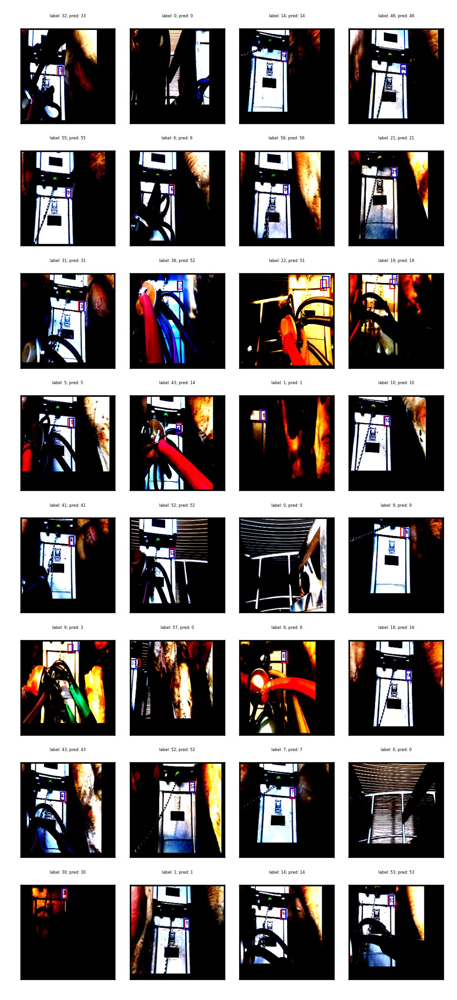

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

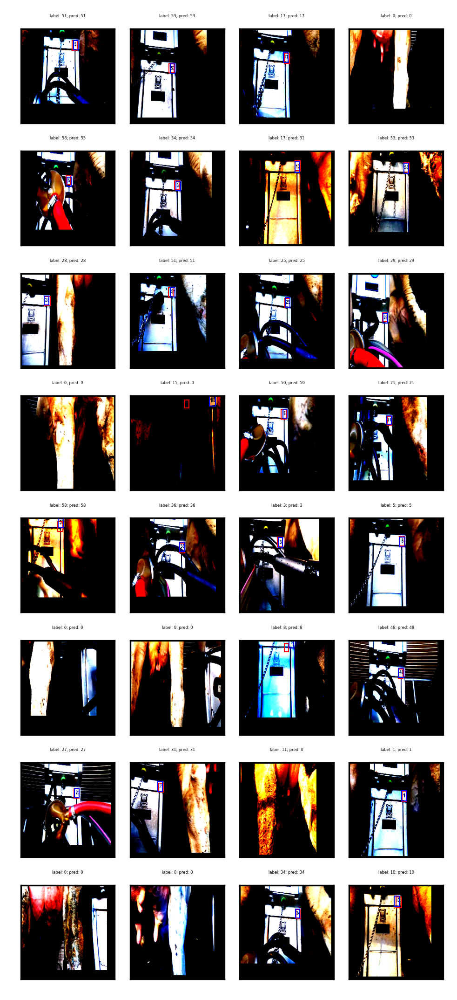

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


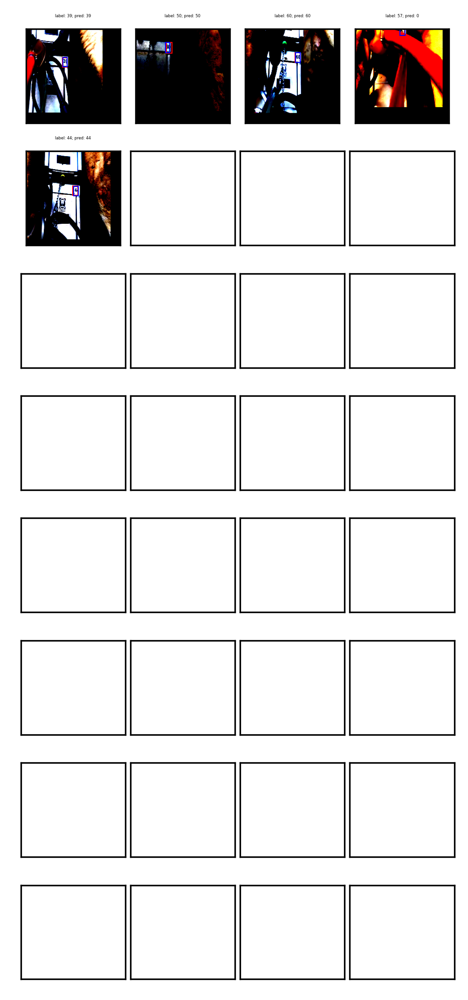

In [80]:
PATH = f'ob1_221_v5.pth'
model.load_state_dict(torch.load(PATH))
model.eval()
all_pred = []
with torch.no_grad():
    for data in test_loader:
        image, box_target, class_target = data
        box_target = box_target.to(torch.float32)
        image, class_target, box_target = image.to('cuda'), class_target.to('cuda'), box_target.to('cuda')
        class_pred, box_pred = model(image)         
        _, pred_label = torch.max(class_pred, dim=-1)
        all_pred+=pred_label.tolist()

        #---------------------Plot Figures----------------------------------------
        image, box_pred, pred_label = image.to('cpu'), box_pred.to('cpu'), pred_label.to('cpu')
        #for r in range(image.shape[0]):
        os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
            
            
        fig, ax = plt.subplots(8,4,figsize=(4,9))
        
        r = 0
        for row in range(8):
            for col in range(4):
                if r<image.shape[0]:
                    x, y, h, w = box_target[r]
                    xi, yi, hi, wi = box_pred[r]
                    ax[row,col].set_title(f'label: {class_target[r]}; pred: {pred_label[r]}',fontsize = 2)
                    ax[row,col].imshow(image[r].permute(1,2,0), 'gray')
                    rect=patches.Rectangle((yi-2,xi),wi,hi, linewidth=0.5, edgecolor='r', facecolor='none')
                    rect0=patches.Rectangle((y-2,x),w,h, linewidth=0.5, edgecolor='b', facecolor='none')
                    ax[row,col].add_patch(rect)
                    ax[row,col].add_patch(rect0)
                    ax[row,col].set_xticks([])
                    ax[row,col].set_yticks([])
                    r+=1
                else:
                    ax[row,col].set_xticks([])
                    ax[row,col].set_yticks([])
        plt.subplots_adjust(wspace = 0.05, hspace = 0.3)
        plt.show()
    

# Print out the one has wrong prediciton

In [46]:
df_test['pred']=all_pred
df_test

,imageFilename,box_position_1,box_position_2,box_position_3,box_position_4,class_names,pred
0,GH030061_12040.png,172.0,81.0,25.0,24.0,28,28
1,GH030072_2783.png,289.0,94.0,23.0,21.0,42,42
2,GH010059_45.png,0.0,0.0,0.0,0.0,0,0
3,GH030072_4929.png,288.0,94.0,23.0,23.0,46,46
4,GH020072_31411.png,0.0,0.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...
256,GH010066_8162.png,272.0,115.0,21.0,23.0,39,39
257,GH010062_3030.png,187.0,84.0,23.0,24.0,50,50
258,GH010070_2701.png,277.0,103.0,24.0,23.0,60,60
259,GH010058_25646.png,261.0,54.0,25.0,22.0,57,0


In [47]:
wrong_predict = df_test.loc[~(df_test['class_names'] == df_test['pred'])].sort_values('class_names').iloc[:,[0,-2,-1]]
wrong_predict

,imageFilename,class_names,pred
212,GH050058_3688.png,9,0
165,GH040058_2289.png,9,12
250,GH010060_28490.png,11,0
39,GH040058_4933.png,14,27
237,GH010058_3025.png,15,0
161,GH020066_28619.png,15,39
230,GH020058_4637.png,17,0
103,GH030061_4966.png,20,0
199,GH030060_5933.png,21,12
130,GH010058_6727.png,22,26


In [81]:
wrong_predict.shape

(27, 3)

In [48]:
wrong_predict.groupby('class_names').count()

,imageFilename,pred
class_names,,
9,2,2
11,1,1
14,1,1
15,2,2
17,1,1
20,1,1
21,1,1
22,1,1
23,1,1


# 5. Write a four-page report using LaTex and upload your paper to ResearchGate or Arxiv, and put your paper link here.


* https://www.researchgate.net/publication/370125126_Object_Detection_for_Recognition_of_Cow_Stall_Labels

# 6. Grading rubric

(1). Code ------- 20 points (you also need to upload your final model as a pt file, and add paper link)

(2). Grammer ---- 20 points

(3). Introduction & related work --- 10 points

(4). Method  ---- 20 points

(5). Results ---- 20 points

(6). Discussion - 10 points

* Ref:  
1. IoU: https://pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/    
   https://www.youtube.com/watch?v=GxW0YdPvukg&ab_channel=IdiotDeveloper  
  
2. Augmentation for image and bounding box:https://discuss.pytorch.org/t/torchvision-transfors-how-to-perform-identical-transform-on-both-image-and-target/10606/48  
3. Build model:https://pyimagesearch.com/2021/11/01/training-an-object-detector-from-scratch-in-pytorch/  

  
